<div style="background: linear-gradient(135deg, #1a1a2e 0%, #16213e 50%, #0f3460 100%); padding: 40px; border-radius: 15px; text-align: center; margin-bottom: 20px;">
<h1 style="color: #e94560; font-size: 2.5em; margin-bottom: 10px;">Reconhecimento de Imagens e Objetos</h1>
<h2 style="color: #a8dadc; font-size: 1.5em; font-weight: 300;">De Transfer Learning aos modelos fundacionais: R-CNN, YOLO, ViT, DETR, CLIP, Stable Diffusion e SAM</h2>
<p style="color: #8ecae6; font-size: 1.1em; margin-top: 15px;">MBA em Inteligência Artificial — FIAP · Aula noturna</p>
<hr style="border-color: #e94560; margin: 20px 0;">
<p style="color: #caf0f8;"><em>Execute em ambiente com GPU (Google Colab — runtime T4 gratuito)</em></p>
</div>

### Como este notebook está organizado

Este é o material de apoio prático para a aula inteira. Ele abre com uma revisão rápida de transfer learning e depois acompanha modelos de detecção, segmentação e geração de imagem — de Faster R-CNN até os modelos fundacionais atuais (CLIP, Stable Diffusion, SAM). Cada seção corresponde a um bloco do cronograma da noite:

| Seção | Tema |
|---|---|
| 0 | Setup e cache (rodar **antes** da aula) |
| 1 | Transfer Learning — aquecimento (VGG19) |
| 2 | R-CNN, Fast/Faster R-CNN, Mask R-CNN — inferência |
| 3 | YOLO e SSD — fine-tuning curto |
| 4 | Vision Transformer (ViT) e DETR |
| 5 | CLIP — classificação zero-shot |
| 6 | Stable Diffusion — geração de imagens |
| 7 | SAM — segmentação interativa |
| 8 | Síntese final — pipeline CLIP → detecção → SAM |

> **Regra de ouro da noite:** é uma única sessão de runtime para vários modelos grandes. Toda seção que carrega um modelo na GPU termina com uma célula de limpeza (`del` + `torch.cuda.empty_cache()` + `gc.collect()`) seguida de uma checagem de memória livre. Não pule essas células — sem elas a GPU vai estourar de memória (OOM) no meio da aula.


---
# Seção 0 — Setup e Cache

> **ANTES DA AULA:** execute todas as células desta seção fora do horário de aula. Alguns downloads somam alguns GB (Stable Diffusion e SAM são os maiores) e podem levar minutos dependendo da conexão. Chegar com tudo já baixado é o que garante que a aula ao vivo rode sem travar em downloads.

O que esta seção faz:
1. Clona o repositório da disciplina (imagens e utilitários já prontos)
2. Instala todas as bibliotecas usadas na noite, de uma vez
3. Baixa e armazena em cache **todos** os checkpoints de modelo que vamos usar
4. Confirma que a GPU está disponível
5. Carrega a imagem de trabalho — a mesma imagem será reaproveitada em todas as seções seguintes


In [1]:
# Clona o repositório com os materiais da aula
!rm -rf fiap-ml-visao-computacional/
!git clone https://github.com/FIAPON/fiap-ml-visao-computacional.git
%cd fiap-ml-visao-computacional/aula-5-machine-learning-aplicado/


Cloning into 'fiap-ml-visao-computacional'...
remote: Enumerating objects: 67187, done.
remote: Counting objects: 100% (32/32), done.
remote: Compressing objects: 100% (24/24), done.
remote: Total 67187 (delta 16), reused 22 (delta 8), pack-reused 67155 (from 2)
Receiving objects: 100% (67187/67187), 1.51 GiB | 16.11 MiB/s, done.
Resolving deltas: 100% (508/508), done.
Updating files: 100% (68215/68215), done.
/content/fiap-ml-visao-computacional/aula-5-machine-learning-aplicado


### 0.1 Instalação das dependências

Uma única célula com tudo que a noite inteira vai usar: `torchvision` (R-CNN/Mask R-CNN, já vem no Colab), `ultralytics` (YOLO, SAM), `transformers` (ViT, DETR, CLIP), `diffusers` (Stable Diffusion) e utilitários de visualização.


In [2]:
%%capture
!pip install -q --upgrade ultralytics transformers diffusers accelerate safetensors
!pip install -q supervision ipywidgets watermark


In [3]:
import watermark
%reload_ext watermark
%watermark -a "MBA FIAP — Visão Computacional" --iversions


Author: MBA FIAP — Visão Computacional

watermark: 2.6.0



### 0.2 Verificação de GPU

A aula inteira depende de GPU. Sem ela, os modelos de geração de imagem e os modelos maiores de detecção ficam inviáveis em tempo de aula (minutos viram horas). Rode a célula abaixo **antes de prosseguir** — se aparecer o aviso, corrija em `Ambiente de execução → Alterar tipo de ambiente de execução → GPU (T4)` antes de continuar.


In [4]:
import torch
import gc

gpu_ok = torch.cuda.is_available()

if gpu_ok:
    props = torch.cuda.get_device_properties(0)
    print(f"GPU disponível: {props.name}")
    print(f"VRAM total: {props.total_memory / 1e9:.1f} GB")
else:
    print("!! NENHUMA GPU DETECTADA !!")
    print("Va em: Ambiente de execucao -> Alterar tipo de ambiente de execucao -> GPU (T4)")
    print("Sem GPU, as secoes de Stable Diffusion e SAM podem nao rodar em tempo habil de aula.")

DEVICE = torch.device("cuda" if gpu_ok else "cpu")
print(f"\nDevice em uso: {DEVICE}")


GPU disponível: Tesla T4
VRAM total: 15.6 GB

Device em uso: cuda


### 0.3 Cache de todos os checkpoints da noite

Baixar tudo agora evita qualquer espera ao vivo durante a aula. São aproximadamente 3-4 GB no total (o maior bloco é Stable Diffusion).


In [5]:
import os
import urllib.request

os.makedirs("checkpoints", exist_ok=True)

print("Baixando pesos do torchvision (Faster R-CNN e Mask R-CNN)...")
from torchvision.models.detection import (
    fasterrcnn_resnet50_fpn, FasterRCNN_ResNet50_FPN_Weights,
    maskrcnn_resnet50_fpn, MaskRCNN_ResNet50_FPN_Weights,
)
_ = fasterrcnn_resnet50_fpn(weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT)
_ = maskrcnn_resnet50_fpn(weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT)
del _
print("OK — torchvision detection\n")

print("Baixando YOLO11n (deteccao) e SAM2...")
from ultralytics import YOLO, SAM
_ = YOLO("yolo11n.pt")
_ = SAM("sam2.1_b.pt")
del _
print("OK — Ultralytics (YOLO11 + SAM2)\n")

print("Baixando ViT (classificacao)...")
from transformers import ViTImageProcessor, ViTForImageClassification
_ = ViTImageProcessor.from_pretrained("google/vit-base-patch16-224")
_ = ViTForImageClassification.from_pretrained("google/vit-base-patch16-224")
del _
print("OK — ViT\n")

print("Baixando DETR (deteccao)...")
from transformers import DetrImageProcessor, DetrForObjectDetection
_ = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")
_ = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50")
del _
print("OK — DETR\n")

print("Baixando CLIP...")
from transformers import CLIPModel, CLIPProcessor
_ = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
_ = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
del _
print("OK — CLIP\n")

print("Baixando Stable Diffusion Turbo (geracao de imagem)...")
from diffusers import AutoPipelineForText2Image
_ = AutoPipelineForText2Image.from_pretrained("stabilityai/sd-turbo")
del _
print("OK — Stable Diffusion Turbo\n")

gc.collect()
torch.cuda.empty_cache() if gpu_ok else None
print("Cache completo! Todos os checkpoints estao salvos localmente (~/.cache).")


Baixando pesos do torchvision (Faster R-CNN e Mask R-CNN)...
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth


100%|██████████| 160M/160M [00:01<00:00, 106MB/s]


Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth


100%|██████████| 170M/170M [00:01<00:00, 94.8MB/s]


OK — torchvision detection

Baixando YOLO11n (deteccao) e SAM2...
Creating new Ultralytics Settings v0.0.7 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart#ultralytics-settings.
OK — Ultralytics (YOLO11 + SAM2)

Baixando ViT (classificacao)...


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

model.safetensors: reconstructing file:   0%|          |  0.00B /  346MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/200 [00:00<?, ?it/s]

OK — ViT

Baixando DETR (deteccao)...


preprocessor_config.json:   0%|          | 0.00/290 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.59k [00:00<?, ?B/s]

model.safetensors: reconstructing file:   0%|          |  0.00B /  167MB            

model.safetensors: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/530 [00:00<?, ?it/s]

[transformers] DetrForObjectDetection LOAD REPORT from: facebook/detr-resnet-50
Key                                                            | Status     |  | 
---------------------------------------------------------------+------------+--+-
model.backbone.model.layer3.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 
model.backbone.model.layer2.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 
model.backbone.model.layer4.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 
model.backbone.model.layer1.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


OK — DETR

Baixando CLIP...


config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin: reconstructing file:   0%|          |  0.00B /  605MB            

pytorch_model.bin: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

model.safetensors: reconstructing file:   0%|          |  0.00B /  605MB            

model.safetensors: downloading bytes:           |  0.00B            

preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

OK — CLIP

Baixando Stable Diffusion Turbo (geracao de imagem)...


[transformers] `Siglip2ImageProcessorFast` is deprecated. The `Fast` suffix for image processors has been removed; use `Siglip2ImageProcessor` instead.
/usr/local/lib/python3.13/dist-packages/huggingface_hub/utils/_validators.py:205: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `hf_hub_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(


model_index.json:   0%|          | 0.00/616 [00:00<?, ?B/s]

Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/372 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


OK — Stable Diffusion Turbo

Cache completo! Todos os checkpoints estao salvos localmente (~/.cache).


### 0.4 Imagem de trabalho da noite

Envie uma foto sua (rosto, objetos na mesa, uma cena qualquer com pessoas ou objetos do dia a dia funciona bem — R-CNN, YOLO e DETR são treinados no COCO, que tem 80 classes do cotidiano). Se ninguém enviar nada, o notebook cai automaticamente em imagens de exemplo de licença livre.

**Esta é a única vez que fazemos upload de imagem.** A mesma imagem (`WORK_IMAGE_PATH` / `work_image_rgb`) será reaproveitada em todas as seções seguintes.


Envie sua foto (ou cancele/feche a caixa para usar uma imagem de exemplo)...


Nenhum upload recebido — usando imagem de exemplo do repositorio: imagens/pessoas1.jpg


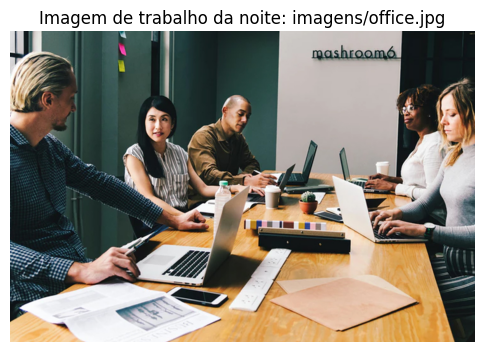


Resolucao: 1000x668
Esta imagem (work_image_rgb / WORK_IMAGE_PATH) sera reutilizada em TODAS as secoes seguintes.


In [35]:
import pathlib
import urllib.request
import cv2
import matplotlib.pyplot as plt
import random
from glob import glob

SAMPLE_IMAGES = {
    "pessoas": "imagens/pessoas1.jpg",
    "escritorio": "imagens/office.jpg",
    "cachorro": "imagens/dog2.jpeg",
}


FALLBACK_URLS = {
    "pessoas": "https://media.roboflow.com/notebooks/examples/dog.jpeg",
    "escritorio": "https://howthingswork.org/wp-content/uploads/2017/05/Cars-down-the-road-e1494988061941.jpg",
}

def load_work_image():
    """Tenta upload manual do aluno; se nao houver, usa imagem local do repo; por ultimo, baixa da web."""
    try:
        from google.colab import files
        print("Envie sua foto (ou cancele/feche a caixa para usar uma imagem de exemplo)...")
        uploaded = files.upload()
        if uploaded:
            fname = list(uploaded.keys())[0]
            return fname
    except Exception:
        pass

    for path in SAMPLE_IMAGES.values():
        image = random.choice(list(SAMPLE_IMAGES.values()))
        if pathlib.Path(path).exists():
            print(f"Nenhum upload recebido — usando imagem de exemplo do repositorio: {path}")
            return image

    fname = "sample_fallback.jpg"
    url = list(FALLBACK_URLS.values())[0]
    urllib.request.urlretrieve(url, fname)
    print(f"Nenhuma imagem local encontrada — baixado exemplo de licenca livre: {fname}")
    return fname

WORK_IMAGE_PATH = load_work_image()
work_image_bgr = cv2.imread(WORK_IMAGE_PATH)
work_image_rgb = cv2.cvtColor(work_image_bgr, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(6, 6))
plt.imshow(work_image_rgb)
plt.title(f"Imagem de trabalho da noite: {WORK_IMAGE_PATH}")
plt.axis("off")
plt.show()

print(f"\nResolucao: {work_image_rgb.shape[1]}x{work_image_rgb.shape[0]}")
print("Esta imagem (work_image_rgb / WORK_IMAGE_PATH) sera reutilizada em TODAS as secoes seguintes.")


> **Dica para o professor:** rode a célula acima uma única vez, no começo da aula. Se quiser trocar de imagem no meio da noite (por exemplo, usar a foto de outro aluno), basta rodar essa célula de novo — todas as seções seguintes leem `work_image_rgb` e `WORK_IMAGE_PATH` dinamicamente.


---
# Seção 1 — Transfer Learning: Aquecimento

Antes de entrarmos nos detectores modernos, uma revisão rápida e prática do conceito que sustenta praticamente tudo que vem a seguir na noite: **transfer learning**. Todos os modelos das próximas seções (Faster R-CNN, YOLO, DETR, ViT, CLIP) são, no fundo, aplicações desse mesmo princípio em escala maior.

> **A ideia central:** treinar uma rede do zero exige milhões de imagens rotuladas e dias de GPU. Em vez disso, reaproveitamos uma rede já treinada em um dataset gigante (ImageNet, 1.2M imagens, 1000 classes) — ela já aprendeu uma hierarquia de features genéricas (bordas → texturas → partes de objetos → objetos completos) — e adaptamos apenas a "cabeça" final para a nossa tarefa específica.

```
ImageNet (1.2M imagens, 1000 classes)
 ↓
[VGG19 — hierarquia de features já aprendida]
 camada 1:  bordas simples
 camada 5:  texturas
 camada 10: partes de objetos
 camada 19: objetos completos
 ↓
[CONGELAR — layer.trainable = False]
 ↓
[Nova camada Dense — treinada do zero, só para a nossa tarefa]
```

**Dataset do exemplo:** American Sign Language Digits — dígitos 0–9 em linguagem de sinais americana (5.000 imagens, 10 classes). Como a turma já domina o conceito, o objetivo aqui não é ensinar transfer learning do zero, e sim relembrar o padrão de código e destravar a intuição de "por que isso funciona" antes de vermos a mesma lógica reaparecer em CLIP e ViT.


In [36]:
from tensorflow.keras.applications import VGG19
from tensorflow.keras import layers, Model
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
import cv2
import numpy as np

print(f"TensorFlow {tf.__version__}")
print(f"GPU disponivel: {len(tf.config.list_physical_devices('GPU')) > 0}")

!rm -rf dataset-american-sign-language-digit/
!git clone https://github.com/michelpf/dataset-american-sign-language-digit --quiet
print("Dataset ASL baixado!")


TensorFlow 2.20.0
GPU disponivel: True
Dataset ASL baixado!


### 1.1 Dados e augmentation

Poucas linhas: `ImageDataGenerator` aplica data augmentation (shear, zoom, flip horizontal) para enriquecer o treino sem precisar de mais imagens reais — útil quando o dataset é pequeno, como aqui.


In [37]:
train_datagen_tl = ImageDataGenerator(
    shear_range=10,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.3,
    preprocessing_function=preprocess_input,
)

train_gen_tl = train_datagen_tl.flow_from_directory(
    "dataset-american-sign-language-digit/dataset",
    batch_size=32,
    class_mode="categorical",
    color_mode="rgb",
    target_size=(128, 128),
    subset="training",
)
val_gen_tl = train_datagen_tl.flow_from_directory(
    "dataset-american-sign-language-digit/dataset",
    batch_size=32,
    class_mode="categorical",
    color_mode="rgb",
    target_size=(128, 128),
    subset="validation",
)
print(f"Classes: {train_gen_tl.class_indices}")


Found 3500 images belonging to 10 classes.
Found 1500 images belonging to 10 classes.
Classes: {'0': 0, '1': 1, '2': 2, '3': 3, '4': 4, '5': 5, '6': 6, '7': 7, '8': 8, '9': 9}


### 1.2 VGG19 congelado + cabeça nova

`include_top=False` remove as camadas densas do VGG19 — sobra só o extrator de features (backbone). Congelamos todos os pesos (`layer.trainable = False`) e treinamos apenas a cabeça de classificação nova, criada para as 10 classes do ASL Digits.


In [38]:
conv_base = VGG19(include_top=False, input_shape=(128, 128, 3))

for layer in conv_base.layers:
    layer.trainable = False

print(f"Camadas do VGG19: {len(conv_base.layers)} (todas congeladas)")

x = conv_base.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(128, activation="relu")(x)
predictions = layers.Dense(10, activation="softmax")(x)

model_tl = Model(conv_base.input, predictions)

n_trainable = sum(int(np.prod(v.shape)) for v in model_tl.trainable_weights)
n_total = model_tl.count_params()
print(f"Parametros treinaveis: {n_trainable:,} de {n_total:,} totais ({n_trainable/n_total:.1%})")


80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step
Camadas do VGG19: 22 (todas congeladas)
Parametros treinaveis: 66,954 de 20,091,338 totais (0.3%)


> **Fine-tuning curto e real** — poucas épocas (5), igual ao espírito das próximas seções: mostrar o processo funcionando ao vivo, não maximizar métrica.


In [39]:
model_tl.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])
history_tl = model_tl.fit(train_gen_tl, epochs=5, validation_data=val_gen_tl, verbose=1)


Epoch 1/5
110/110 ━━━━━━━━━━━━━━━━━━━━ 47s 355ms/step - accuracy: 0.5117 - loss: 1.8126 - val_accuracy: 0.7160 - val_loss: 1.4057
Epoch 2/5
110/110 ━━━━━━━━━━━━━━━━━━━━ 29s 266ms/step - accuracy: 0.7774 - loss: 1.0549 - val_accuracy: 0.8040 - val_loss: 0.8910
Epoch 3/5
110/110 ━━━━━━━━━━━━━━━━━━━━ 31s 285ms/step - accuracy: 0.8483 - loss: 0.6913 - val_accuracy: 0.8500 - val_loss: 0.6461
Epoch 4/5
110/110 ━━━━━━━━━━━━━━━━━━━━ 28s 258ms/step - accuracy: 0.8917 - loss: 0.4932 - val_accuracy: 0.8507 - val_loss: 0.5477
Epoch 5/5
110/110 ━━━━━━━━━━━━━━━━━━━━ 28s 256ms/step - accuracy: 0.9157 - loss: 0.3856 - val_accuracy: 0.8687 - val_loss: 0.4403


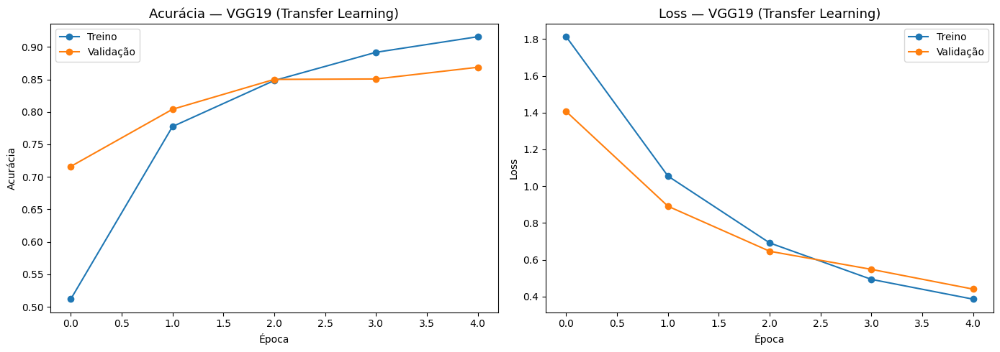

Acuracia final de validacao: 86.9%
Poucas epocas, poucos parametros treinaveis, e o modelo ja converge bem
-- essa e a razao pratica de usar transfer learning em vez de treinar do zero.


In [40]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].plot(history_tl.history["accuracy"], marker="o", label="Treino")
axes[0].plot(history_tl.history["val_accuracy"], marker="o", label="Validação")
axes[0].set_title("Acurácia — VGG19 (Transfer Learning)", fontsize=13)
axes[0].set_xlabel("Época"); axes[0].set_ylabel("Acurácia"); axes[0].legend()

axes[1].plot(history_tl.history["loss"], marker="o", label="Treino")
axes[1].plot(history_tl.history["val_loss"], marker="o", label="Validação")
axes[1].set_title("Loss — VGG19 (Transfer Learning)", fontsize=13)
axes[1].set_xlabel("Época"); axes[1].set_ylabel("Loss"); axes[1].legend()
plt.tight_layout()
plt.show()

print(f"Acuracia final de validacao: {max(history_tl.history['val_accuracy']):.1%}")
print("Poucas epocas, poucos parametros treinaveis, e o modelo ja converge bem")
print("-- essa e a razao pratica de usar transfer learning em vez de treinar do zero.")


### 1.3 Inferência rápida


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


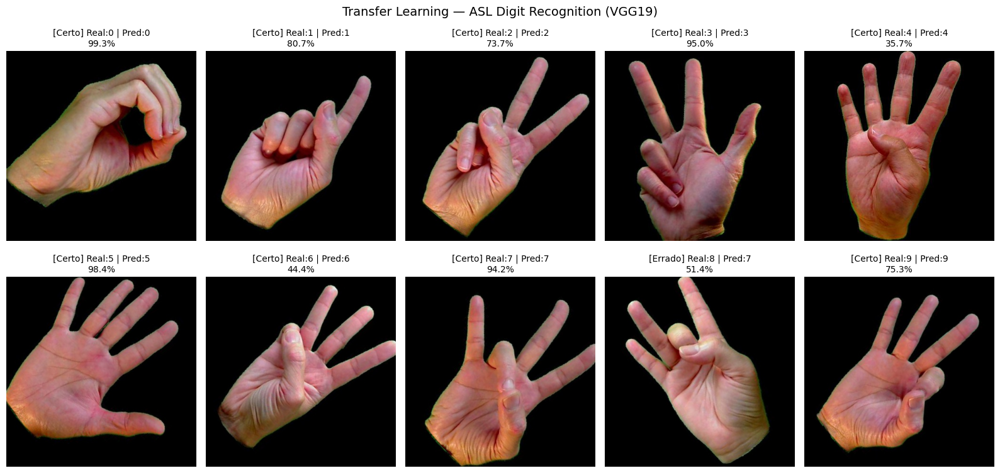

In [41]:
lista_imgs_asl, lista_arrs_asl = [], []
for i in range(10):
    path = f"dataset-american-sign-language-digit/dataset/{i}/Sign {i} (1).jpeg"
    img = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
    lista_imgs_asl.append(img)
    lista_arrs_asl.append(cv2.resize(img, (128, 128)))

arr_asl = preprocess_input(np.array(lista_arrs_asl, dtype="float32"))
pred_asl = model_tl.predict(arr_asl)
y_pred_asl = pred_asl.argmax(axis=-1)

fig, axes = plt.subplots(2, 5, figsize=(16, 8))
for i, (img, pred) in enumerate(zip(lista_imgs_asl, y_pred_asl)):
    ax = axes[i // 5][i % 5]
    conf = pred_asl[i].max() * 100
    acerto = "Certo" if pred == i else "Errado"
    ax.imshow(img)
    ax.set_title(f"[{acerto}] Real:{i} | Pred:{pred}\n{conf:.1f}%", fontsize=10)
    ax.axis("off")
plt.suptitle("Transfer Learning — ASL Digit Recognition (VGG19)", fontsize=14)
plt.tight_layout()
plt.show()


### 1.4 Liberando a GPU


In [42]:
import gc
import tensorflow as tf

del model_tl, conv_base, history_tl
tf.keras.backend.clear_session()
gc.collect()
if torch.cuda.is_available():
    torch.cuda.empty_cache()
print("VGG19 (Transfer Learning) removido da GPU — sessao Keras/TF limpa.")


VGG19 (Transfer Learning) removido da GPU — sessao Keras/TF limpa.


In [43]:
if torch.cuda.is_available():
    free_gb, total_gb = torch.cuda.mem_get_info()
    print(f"GPU: {(total_gb - free_gb) / 1e9:.2f} GB em uso / {total_gb / 1e9:.1f} GB total")
!nvidia-smi --query-gpu=memory.used,memory.total --format=csv


GPU: 7.67 GB em uso / 15.6 GB total
memory.used [MiB], memory.total [MiB]
7315 MiB, 15360 MiB


---
# Seção 2 — Detecção Baseada em Regiões

**R-CNN → Fast R-CNN → Faster R-CNN → Mask R-CNN**: a evolução da família R-CNN é a evolução de "como propor regiões candidatas de forma cada vez mais rápida":

- **R-CNN (2014):** ~2000 regiões propostas por *selective search*, cada uma passada individualmente pela CNN. Preciso, mas lentíssimo (dezenas de segundos por imagem).
- **Fast R-CNN (2015):** a imagem inteira passa pela CNN uma única vez; as regiões são recortadas do mapa de features (*RoI Pooling*). Muito mais rápido, mas a proposta de regiões (selective search) ainda é feita fora da rede, na CPU.
- **Faster R-CNN (2015):** substitui o selective search por uma *Region Proposal Network* (RPN) — uma pequena rede convolucional que aprende a propor regiões. Agora todo o pipeline é uma única rede, treinável de ponta a ponta.
- **Mask R-CNN (2017):** adiciona um ramo extra à Faster R-CNN que prevê uma **máscara de segmentação por pixel** para cada objeto detectado, além da caixa e da classe.

Nesta seção usamos **apenas inferência** com modelos pré-treinados no COCO (80 classes), via `torchvision.models.detection` — sem Detectron2, para evitar fricção de instalação em aula ao vivo.


In [44]:
import time
import torch
import torchvision
import matplotlib.pyplot as plt
import numpy as np
from torchvision.models.detection import (
    fasterrcnn_resnet50_fpn, FasterRCNN_ResNet50_FPN_Weights,
)
from torchvision.transforms.functional import to_tensor

frcnn_weights = FasterRCNN_ResNet50_FPN_Weights.DEFAULT
COCO_CLASSES = frcnn_weights.meta["categories"]

model_frcnn = fasterrcnn_resnet50_fpn(weights=frcnn_weights).to(DEVICE).eval()
print("Faster R-CNN carregado.")


Faster R-CNN carregado.


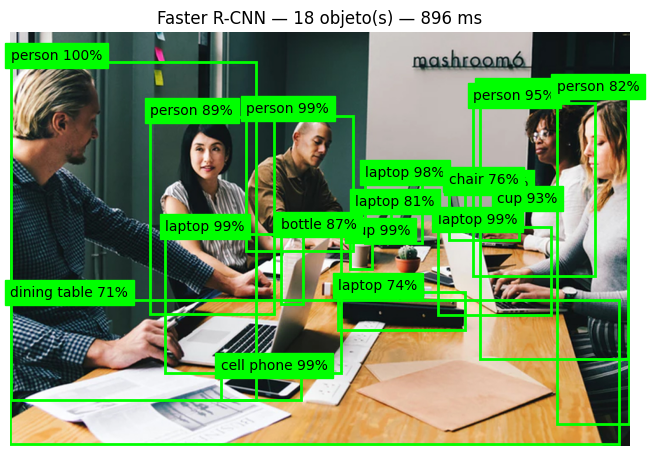

Latencia Faster R-CNN: 896 ms


In [45]:
# Inferencia na imagem de trabalho
img_tensor = to_tensor(work_image_rgb).to(DEVICE)

with torch.no_grad():
    t0 = time.time()
    pred = model_frcnn([img_tensor])[0]
    latency_frcnn_ms = (time.time() - t0) * 1000

CONF_THRESH = 0.7
keep = pred["scores"] > CONF_THRESH
boxes_frcnn  = pred["boxes"][keep].cpu().numpy()
labels_frcnn = pred["labels"][keep].cpu().numpy()
scores_frcnn = pred["scores"][keep].cpu().numpy()

fig, ax = plt.subplots(figsize=(8, 8))
ax.imshow(work_image_rgb)
for box, label, score in zip(boxes_frcnn, labels_frcnn, scores_frcnn):
    x1, y1, x2, y2 = box
    ax.add_patch(plt.Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor="lime", linewidth=2))
    ax.text(x1, y1 - 5, f"{COCO_CLASSES[label]} {score:.0%}", color="black",
            fontsize=10, backgroundcolor="lime")
ax.set_title(f"Faster R-CNN — {len(boxes_frcnn)} objeto(s) — {latency_frcnn_ms:.0f} ms")
ax.axis("off")
plt.show()

print(f"Latencia Faster R-CNN: {latency_frcnn_ms:.0f} ms")


### 2.1 De caixas a máscaras — Mask R-CNN

Trocamos o modelo por Mask R-CNN, que além da caixa devolve uma máscara binária por objeto detectado.


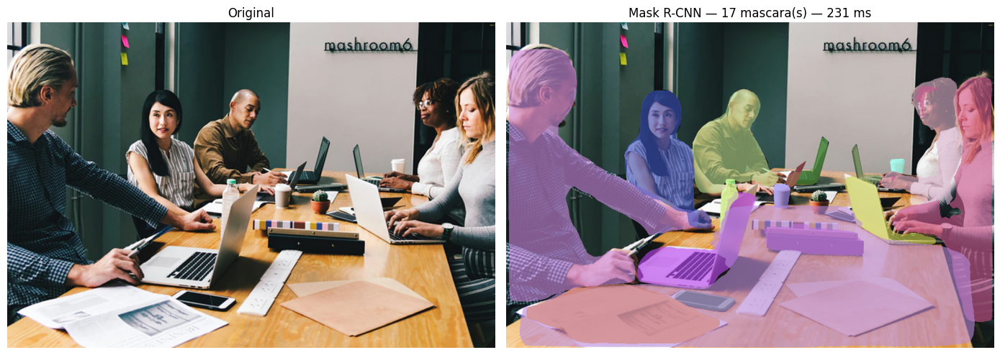

Latencia Mask R-CNN: 231 ms (mais lento que Faster R-CNN por causa do ramo de mascara)


In [46]:
from torchvision.models.detection import maskrcnn_resnet50_fpn, MaskRCNN_ResNet50_FPN_Weights

mrcnn_weights = MaskRCNN_ResNet50_FPN_Weights.DEFAULT
model_mrcnn = maskrcnn_resnet50_fpn(weights=mrcnn_weights).to(DEVICE).eval()

with torch.no_grad():
    t0 = time.time()
    pred_mask = model_mrcnn([img_tensor])[0]
    latency_mrcnn_ms = (time.time() - t0) * 1000

keep_m = pred_mask["scores"] > CONF_THRESH
boxes_mrcnn  = pred_mask["boxes"][keep_m].cpu().numpy()
labels_mrcnn = pred_mask["labels"][keep_m].cpu().numpy()
masks_mrcnn  = pred_mask["masks"][keep_m].cpu().numpy()  # (N, 1, H, W), valores [0,1]

# guardamos para comparar com o SAM na Secao 7
saved_maskrcnn_result = {
    "boxes": boxes_mrcnn, "labels": labels_mrcnn, "masks": masks_mrcnn,
    "class_names": COCO_CLASSES,
}

overlay = work_image_rgb.copy().astype(float)
rng = np.random.default_rng(42)
for mask in masks_mrcnn:
    color = rng.uniform(50, 255, size=3)
    m = mask[0] > 0.5
    overlay[m] = overlay[m] * 0.4 + color * 0.6

fig, axes = plt.subplots(1, 2, figsize=(14, 7))
axes[0].imshow(work_image_rgb); axes[0].set_title("Original"); axes[0].axis("off")
axes[1].imshow(overlay.astype(np.uint8))
axes[1].set_title(f"Mask R-CNN — {len(masks_mrcnn)} mascara(s) — {latency_mrcnn_ms:.0f} ms")
axes[1].axis("off")
plt.tight_layout()
plt.show()

print(f"Latencia Mask R-CNN: {latency_mrcnn_ms:.0f} ms (mais lento que Faster R-CNN por causa do ramo de mascara)")


### 2.3 Liberando a GPU

Faster R-CNN e Mask R-CNN não são mais necessários. Antes de seguir para a próxima seção, liberamos a memória.


In [47]:
del model_frcnn, model_mrcnn, pred, pred_mask
gc.collect()
torch.cuda.empty_cache()
print("Faster R-CNN e Mask R-CNN removidos da GPU.")


Faster R-CNN e Mask R-CNN removidos da GPU.


In [48]:
if torch.cuda.is_available():
    free_gb, total_gb = torch.cuda.mem_get_info()
    print(f"GPU: {(total_gb - free_gb) / 1e9:.2f} GB em uso / {total_gb / 1e9:.1f} GB total")
    print(f"GPU: {free_gb / 1e9:.2f} GB livres")
!nvidia-smi --query-gpu=memory.used,memory.total --format=csv


GPU: 7.81 GB em uso / 15.6 GB total
GPU: 7.82 GB livres
memory.used [MiB], memory.total [MiB]
7451 MiB, 15360 MiB


---
# Seção 3 — YOLO

R-CNN e suas variantes olham a imagem em **duas etapas** (propor regiões, depois classificar). YOLO ("You Only Look Once") fazem tudo em **uma única passada** pela rede — dividem a imagem em uma grade e preveem caixas e classes diretamente em cada célula. Resultado: muito mais rápido, à custa de um pouco de precisão em objetos pequenos (embora versões recentes do YOLO tenham fechado boa parte dessa diferença).

Vamos usar a biblioteca `ultralytics` (YOLO11) e fazer um **fine-tuning curto e real**, com poucas épocas, em um dataset pequeno já pronto do Roboflow Universe — sem anotação ao vivo.


In [49]:
from ultralytics import YOLO

model_yolo_base = YOLO("yolo11n.pt")  # nano: 2.6M parametros, rapido o suficiente para rodar ao vivo
print("YOLO11n (pre-treinado no COCO) carregado.")


YOLO11n (pre-treinado no COCO) carregado.


### 3.1 Dataset pequeno para fine-tuning

Usamos um dataset já anotado e pequeno do Roboflow Universe (poucas centenas de imagens), para treinar em minutos. Trocar por qualquer outro dataset do Roboflow Universe é só trocar a URL/slug.


In [50]:
%%capture
!pip install -q roboflow


In [51]:
import os

# Dataset pequeno pronto (deteccao de buracos em vias) — ja usado em outras aulas da disciplina.
# Troque pela URL de outro dataset do Roboflow Universe se preferir.
if not os.path.exists("dataset-pothole"):
    !git clone https://github.com/michelpf/dataset-pothole --quiet

print("Dataset pronto para fine-tuning.")


Dataset pronto para fine-tuning.


In [52]:
%%writefile configs_modelo.yaml
path: '/content/fiap-ml-visao-computacional/aula-5-machine-learning-aplicado/dataset-pothole/dataset'
train: 'train/'
val: 'test/'
nc: 1
names: ["pothole"]


Writing configs_modelo.yaml


> **Sobre o número de épocas:** aqui usamos poucas épocas (5) propositalmente — o objetivo é mostrar o *processo* de fine-tuning funcionando ao vivo, não atingir a melhor métrica possível. Em produção, o mesmo dataset renderia bons resultados com 50-100 épocas.


In [53]:
results_ft = model_yolo_base.train(
    data="/content/fiap-ml-visao-computacional/aula-5-machine-learning-aplicado/configs_modelo.yaml",
    epochs=5,
    imgsz=640,
    batch=16,
    device=0 if gpu_ok else "cpu",
    verbose=False,
    plots=True,
)
print("Fine-tuning concluido!")


Ultralytics 8.4.129 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=False, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/fiap-ml-visao-computacional/aula-5-machine-learning-aplicado/configs_modelo.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=5, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic

In [54]:
model_yolo_ft = YOLO(f"{results_ft.save_dir}/weights/best.pt")
print("Modelo fine-tuned carregado a partir de", f"{results_ft.save_dir}/weights/best.pt")


Modelo fine-tuned carregado a partir de /content/fiap-ml-visao-computacional/aula-5-machine-learning-aplicado/runs/detect/train/weights/best.pt


# Análise das Métricas de Treinamento

O YOLO gera automaticamente curvas de desempenho:

| Gráfico | O que avalia |
|---------|-------------|
| **Precision** | Das detecções feitas, quantas eram corretas? |
| **Recall** | Dos objetos reais, quantos foram detectados? |
| **F1-Score** | Balanço entre Precision e Recall |
| **mAP@0.5** | Área sob a curva Precision-Recall (métrica padrão COCO) |

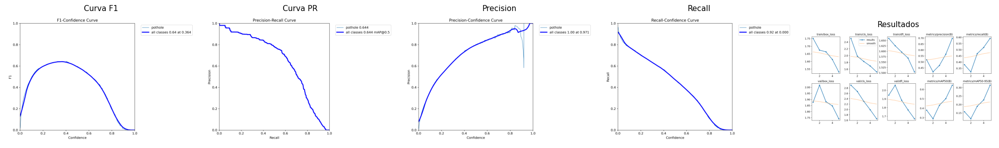

In [80]:
run_dir = "/content/fiap-ml-visao-computacional/aula-5-machine-learning-aplicado/runs/detect/train"

graficos = {
    "BoxF1_curve.png": "Curva F1",
    "BoxPR_curve.png": "Curva PR",
    "BoxP_curve.png":  "Precision",
    "BoxR_curve.png":  "Recall",
    "results.png":     "Resultados",
}

fig, axes = plt.subplots(1, len(graficos), figsize=(20, 4))
for ax, (fname, titulo) in zip(axes, graficos.items()):
    img = cv2.imread(f"{run_dir}/{fname}")
    if img is not None:
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax.set_title(titulo, fontsize=11)
    ax.axis("off")
plt.tight_layout()
plt.show()

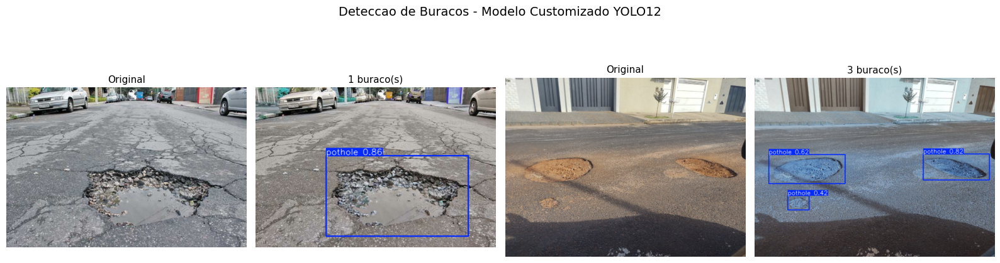

In [81]:
# Inferencia com modelo customizado em imagens novas
dir_pesos    = f"{run_dir}/weights/best.pt"
model_custom = YOLO(dir_pesos)

imgs_buraco = ["imagens/buraco.jpg", "imagens/buraco2.jpeg"]
fig, axes   = plt.subplots(1, len(imgs_buraco) * 2, figsize=(16, 5))

for i, path in enumerate(imgs_buraco):
    img = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
    axes[i * 2].imshow(img)
    axes[i * 2].set_title("Original", fontsize=11)
    axes[i * 2].axis("off")

    res = model_custom.predict(source=img, conf=0.25, verbose=False)
    axes[i * 2 + 1].imshow(cv2.cvtColor(res[0].plot(), cv2.COLOR_BGR2RGB))
    axes[i * 2 + 1].set_title(f"{len(res[0].boxes)} buraco(s)", fontsize=11)
    axes[i * 2 + 1].axis("off")

plt.suptitle("Deteccao de Buracos - Modelo Customizado YOLO12", fontsize=14)
plt.tight_layout()
plt.show()

### 3.2 Comparando com a Seção 2 — visual e latência

Rodamos o YOLO11 (versão base, pré-treinada no COCO — as 80 classes do R-CNN) na **mesma imagem de trabalho** e comparamos visualmente e por latência com o Faster R-CNN da Seção 2.


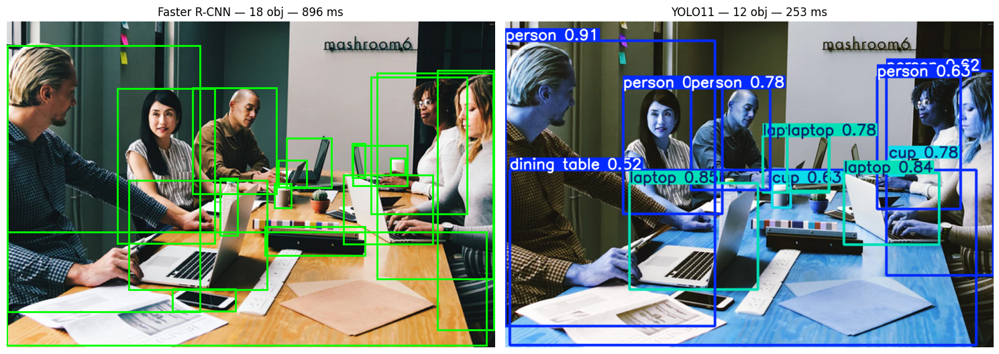

Faster R-CNN: 896 ms
YOLO11:       253 ms
YOLO foi aproximadamente 3.5x mais rapido nesta imagem


In [82]:
t0 = time.time()
model_yolo11 = YOLO("yolo11n.pt")
results_yolo = model_yolo11.predict(source=work_image_rgb, conf=0.5, verbose=False, device=0 if gpu_ok else "cpu")
latency_yolo_ms = (time.time() - t0) * 1000

fig, axes = plt.subplots(1, 2, figsize=(15, 7))
axes[0].imshow(work_image_rgb)
for box, label, score in zip(boxes_frcnn, labels_frcnn, scores_frcnn):
    x1, y1, x2, y2 = box
    axes[0].add_patch(plt.Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor="lime", linewidth=2))
axes[0].set_title(f"Faster R-CNN — {len(boxes_frcnn)} obj — {latency_frcnn_ms:.0f} ms")
axes[0].axis("off")

axes[1].imshow(cv2.cvtColor(results_yolo[0].plot(), cv2.COLOR_BGR2RGB))
axes[1].set_title(f"YOLO11 — {len(results_yolo[0].boxes)} obj — {latency_yolo_ms:.0f} ms")
axes[1].axis("off")
plt.tight_layout()
plt.show()

print(f"Faster R-CNN: {latency_frcnn_ms:.0f} ms")
print(f"YOLO11:       {latency_yolo_ms:.0f} ms")
print(f"YOLO foi aproximadamente {latency_frcnn_ms / latency_yolo_ms:.1f}x mais rapido nesta imagem")

# guardamos para a sintese final (Secao 8)
saved_yolo_result = results_yolo[0]


### 3.3 Liberando a GPU


In [56]:
del model_yolo_base, model_yolo_ft, results_yolo
gc.collect()
torch.cuda.empty_cache()
print("Modelos YOLO removidos da GPU.")


Modelos YOLO removidos da GPU.


In [57]:
if torch.cuda.is_available():
    free_gb, total_gb = torch.cuda.mem_get_info()
    print(f"GPU: {(total_gb - free_gb) / 1e9:.2f} GB em uso / {total_gb / 1e9:.1f} GB total")
!nvidia-smi --query-gpu=memory.used,memory.total --format=csv


GPU: 7.90 GB em uso / 15.6 GB total
memory.used [MiB], memory.total [MiB]
7533 MiB, 15360 MiB


---
# Seção 4 — Vision Transformer (ViT) e DETR

Depois de anos de CNNs dominando visão computacional, o **Vision Transformer (ViT, 2020)** mostrou que a arquitetura Transformer — originalmente criada para texto — também funciona em imagens: a imagem é cortada em *patches* (ex.: 16x16 pixels), cada patch vira um "token", e o *self-attention* aprende a relação entre eles.

O **DETR (DEtection TRansformer, 2020)** aplica a mesma ideia à detecção de objetos: em vez de âncoras e NMS (non-max suppression) como em Faster R-CNN e YOLO, o DETR usa um Transformer encoder-decoder que prevê diretamente um conjunto fixo de caixas, tratando detecção como um problema de correspondência (*bipartite matching*).

Ambos vêm prontos na biblioteca `transformers` da HuggingFace.


In [58]:
from transformers import ViTImageProcessor, ViTForImageClassification
from PIL import Image

vit_processor = ViTImageProcessor.from_pretrained("google/vit-base-patch16-224")
model_vit = ViTForImageClassification.from_pretrained("google/vit-base-patch16-224").to(DEVICE).eval()

pil_image = Image.fromarray(work_image_rgb)
inputs_vit = vit_processor(images=pil_image, return_tensors="pt").to(DEVICE)

with torch.no_grad():
    t0 = time.time()
    logits_vit = model_vit(**inputs_vit).logits
    latency_vit_ms = (time.time() - t0) * 1000

top5 = logits_vit.softmax(-1)[0].topk(5)
print(f"ViT — Top-5 classes (ImageNet-1k) — {latency_vit_ms:.0f} ms\n")
for score, idx in zip(top5.values, top5.indices):
    print(f"  {model_vit.config.id2label[idx.item()]:35s} {score.item():.1%}")


Loading weights:   0%|          | 0/200 [00:00<?, ?it/s]

ViT — Top-5 classes (ImageNet-1k) — 79 ms

  desk                                32.4%
  desktop computer                    14.5%
  notebook, notebook computer         12.0%
  mouse, computer mouse               5.7%
  laptop, laptop computer             5.1%


### 4.1 DETR — detecção com Transformer

O DETR também é treinado no COCO (mesmas 80 classes do Faster R-CNN e YOLO), o que nos permite comparar as três abordagens na mesma imagem.


In [84]:
from transformers import DetrImageProcessor, DetrForObjectDetection

detr_processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")
model_detr = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50").to(DEVICE).eval()

inputs_detr = detr_processor(images=pil_image, return_tensors="pt").to(DEVICE)

with torch.no_grad():
    t0 = time.time()
    outputs_detr = model_detr(**inputs_detr)
    latency_detr_ms = (time.time() - t0) * 1000

target_sizes = torch.tensor([pil_image.size[::-1]]).to(DEVICE)
results_detr = detr_processor.post_process_object_detection(
    outputs_detr, target_sizes=target_sizes, threshold=0.7
)[0]

# guardamos para a sintese final (Secao 8)
saved_detr_result = results_detr

print(f"DETR — {len(results_detr['boxes'])} objeto(s) — {latency_detr_ms:.0f} ms")


Loading weights:   0%|          | 0/530 [00:00<?, ?it/s]

[transformers] DetrForObjectDetection LOAD REPORT from: facebook/detr-resnet-50
Key                                                            | Status     |  | 
---------------------------------------------------------------+------------+--+-
model.backbone.model.layer3.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 
model.backbone.model.layer2.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 
model.backbone.model.layer4.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 
model.backbone.model.layer1.0.downsample.1.num_batches_tracked | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


DETR — 23 objeto(s) — 117 ms


### 4.2 Comparando as caixas: Faster R-CNN vs. YOLO11 vs. DETR

Três arquiteturas completamente diferentes (duas etapas com RPN, single-shot com grade, e Transformer com bipartite matching) na mesma imagem.


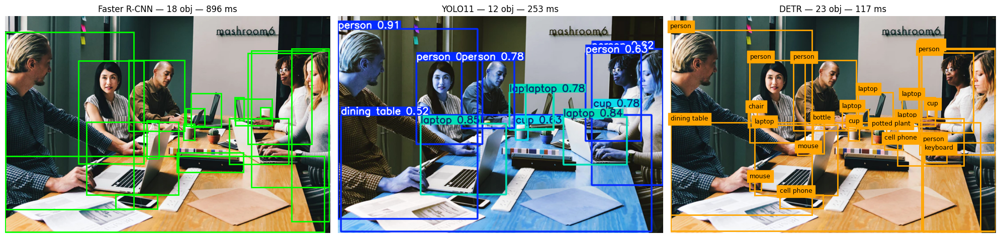

In [85]:
fig, axes = plt.subplots(1, 3, figsize=(20, 7))

axes[0].imshow(work_image_rgb)
for box in boxes_frcnn:
    x1, y1, x2, y2 = box
    axes[0].add_patch(plt.Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor="lime", linewidth=2))
axes[0].set_title(f"Faster R-CNN — {len(boxes_frcnn)} obj — {latency_frcnn_ms:.0f} ms")
axes[0].axis("off")

axes[1].imshow(cv2.cvtColor(saved_yolo_result.plot(), cv2.COLOR_BGR2RGB))
axes[1].set_title(f"YOLO11 — {len(saved_yolo_result.boxes)} obj — {latency_yolo_ms:.0f} ms")
axes[1].axis("off")

axes[2].imshow(work_image_rgb)
for box, label in zip(results_detr["boxes"], results_detr["labels"]):
    x1, y1, x2, y2 = box.cpu().numpy()
    axes[2].add_patch(plt.Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor="orange", linewidth=2))
    axes[2].text(x1, y1 - 5, model_detr.config.id2label[label.item()], color="black",
                 fontsize=9, backgroundcolor="orange")
axes[2].set_title(f"DETR — {len(results_detr['boxes'])} obj — {latency_detr_ms:.0f} ms")
axes[2].axis("off")

plt.tight_layout()
plt.show()


### 4.3 Liberando a GPU


In [61]:
del model_vit, model_detr, inputs_vit, inputs_detr, outputs_detr, logits_vit
gc.collect()
torch.cuda.empty_cache()
print("ViT e DETR removidos da GPU.")


ViT e DETR removidos da GPU.


In [62]:
if torch.cuda.is_available():
    free_gb, total_gb = torch.cuda.mem_get_info()
    print(f"GPU: {(total_gb - free_gb) / 1e9:.2f} GB em uso / {total_gb / 1e9:.1f} GB total")
!nvidia-smi --query-gpu=memory.used,memory.total --format=csv


GPU: 7.90 GB em uso / 15.6 GB total
memory.used [MiB], memory.total [MiB]
7537 MiB, 15360 MiB


---
# Seção 5 — CLIP

Todos os modelos vistos até aqui reconhecem apenas as classes em que foram treinados (as 80 do COCO, ou as 1000 do ImageNet). O **CLIP** (Contrastive Language-Image Pretraining, OpenAI 2021) rompe essa limitação: foi treinado em **400 milhões de pares (imagem, texto)** da internet, aprendendo a colocar imagens e frases no mesmo espaço vetorial.

Isso permite **classificação zero-shot**: em vez de escolher entre classes fixas, você escreve rótulos de texto livres, e o CLIP rankeia a imagem contra eles — sem nunca ter sido treinado especificamente para essas classes.


In [63]:
from transformers import CLIPModel, CLIPProcessor

clip_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
model_clip = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(DEVICE).eval()
print("CLIP carregado.")


Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIP carregado.


### 5.1 Classificação zero-shot interativa

Edite a lista `candidate_labels` com os rótulos que os alunos sugerirem — em português ou inglês, frases curtas ou uma palavra só. O CLIP rankeia a imagem contra cada rótulo.


In [64]:
candidate_labels = [
    "a photo of a person",
    "a photo of an animal",
    "a photo of a city street",
    "a photo of nature",
    "a photo of food",
    # adicione aqui os rotulos sugeridos pelos alunos
]

inputs_clip = clip_processor(
    text=candidate_labels, images=pil_image, return_tensors="pt", padding=True
).to(DEVICE)

with torch.no_grad():
    outputs_clip = model_clip(**inputs_clip)
    probs_clip = outputs_clip.logits_per_image.softmax(dim=1)[0].cpu().numpy()

ranking = sorted(zip(candidate_labels, probs_clip), key=lambda x: -x[1])

# guardamos o resultado para a sintese final (Secao 8)
saved_clip_result = ranking

print("Ranking CLIP (zero-shot):\n")
for label, prob in ranking:
    bar = "#" * int(prob * 40)
    print(f"  {prob:5.1%}  {bar:<40s} {label}")


Ranking CLIP (zero-shot):

  69.5%  ###########################              a photo of a person
  15.2%  ######                                   a photo of nature
   7.5%  ###                                      a photo of food
   4.5%  #                                        a photo of an animal
   3.4%  #                                        a photo of a city street


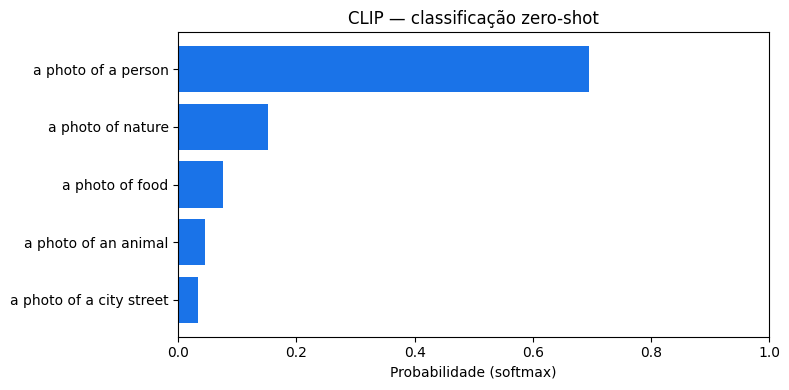

In [65]:
fig, ax = plt.subplots(figsize=(8, 4))
labels_plot = [l for l, _ in ranking]
probs_plot = [p for _, p in ranking]
ax.barh(labels_plot[::-1], probs_plot[::-1], color="#1a73e8")
ax.set_xlabel("Probabilidade (softmax)")
ax.set_title("CLIP — classificação zero-shot")
ax.set_xlim(0, 1)
plt.tight_layout()
plt.show()


> **Para explorar ao vivo com a turma:** peça para 3-4 alunos sugerirem rótulos diferentes (inclusive rótulos "armadilha", ambíguos ou muito específicos) e rode a célula de novo trocando `candidate_labels`. É um jeito rápido de sentir os limites do zero-shot.


### 5.2 Liberando a GPU


In [66]:
del model_clip, inputs_clip, outputs_clip
gc.collect()
torch.cuda.empty_cache()
print("CLIP removido da GPU.")


CLIP removido da GPU.


In [67]:
if torch.cuda.is_available():
    free_gb, total_gb = torch.cuda.mem_get_info()
    print(f"GPU: {(total_gb - free_gb) / 1e9:.2f} GB em uso / {total_gb / 1e9:.1f} GB total")
!nvidia-smi --query-gpu=memory.used,memory.total --format=csv


GPU: 7.90 GB em uso / 15.6 GB total
memory.used [MiB], memory.total [MiB]
7537 MiB, 15360 MiB


---
# Seção 6 — Stable Diffusion

Até aqui, todos os modelos **interpretaram** imagens (classificar, detectar, segmentar). O **Stable Diffusion** faz o caminho inverso: **gera** uma imagem nova a partir de um prompt de texto, usando um processo de difusão — parte de ruído puro e, guiado pelo texto (via um encoder de texto parecido com o do CLIP), remove ruído passo a passo até formar uma imagem coerente.

Usamos a variante **SD-Turbo**, destilada para gerar em **1 único passo de inferência** — segundos em vez de dezenas de segundos, essencial para rodar ao vivo em aula.

> **Atenção:** esta é a seção mais pesada em memória da noite. A limpeza de GPU ao final é **obrigatória**, não opcional — sem ela, o SAM da próxima seção provavelmente não vai caber na T4.


In [68]:
from diffusers import AutoPipelineForText2Image

pipe_sd = AutoPipelineForText2Image.from_pretrained(
    "stabilityai/sd-turbo", torch_dtype=torch.float16 if gpu_ok else torch.float32
).to(DEVICE)
print("Stable Diffusion Turbo carregado.")


/usr/local/lib/python3.13/dist-packages/huggingface_hub/utils/_validators.py:205: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `hf_hub_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(
/usr/local/lib/python3.13/dist-packages/diffusers/utils/deprecation_utils.py:23: FutureWarning: `torch_dtype` is deprecated and will be removed in version 1.0.0. Please use `dtype` instead.
  deprecate("torch_dtype", "1.0.0", _TORCH_DTYPE_DEPRECATION_MESSAGE)


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/372 [00:00<?, ?it/s]

You have disabled the safety checker for <class 'diffusers.pipelines.stable_diffusion.pipeline_stable_diffusion.StableDiffusionPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results. For more information, please have a look at https://github.com/huggingface/diffusers/pull/254 .


Stable Diffusion Turbo carregado.


### 6.1 Geração interativa a partir de prompts dos alunos

Troque `student_prompt` pelo prompt sugerido pela turma e rode a célula. SD-Turbo não precisa de *guidance scale* (`guidance_scale=0.0`) nem de muitos passos (`num_inference_steps=1`) — é isso que o torna rápido o suficiente para gerar ao vivo.


  0%|          | 0/1 [00:00<?, ?it/s]

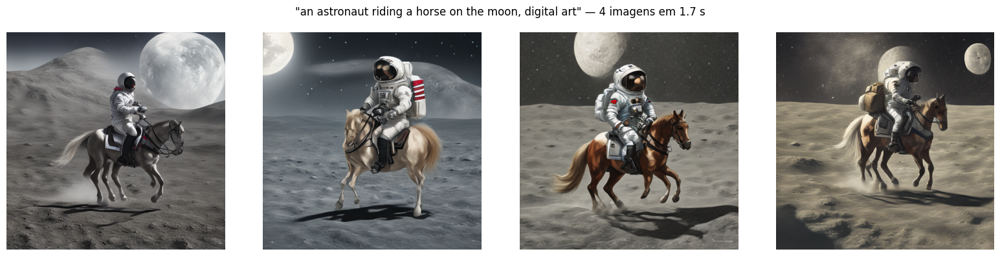

In [69]:
student_prompt = "an astronaut riding a horse on the moon, digital art"  # troque pelo prompt da turma
n_images = 4

t0 = time.time()
generated = pipe_sd(
    prompt=[student_prompt] * n_images,
    num_inference_steps=1,
    guidance_scale=0.0,
).images
latency_sd_s = time.time() - t0

fig, axes = plt.subplots(1, n_images, figsize=(4 * n_images, 4))
for ax, img in zip(axes, generated):
    ax.imshow(img)
    ax.axis("off")
fig.suptitle(f'"{student_prompt}" — {n_images} imagens em {latency_sd_s:.1f} s', fontsize=12)
plt.tight_layout()
plt.show()


> **Para repetir com outro prompt:** basta editar `student_prompt` na célula acima e rodar de novo — o pipeline já está carregado na GPU, então cada nova geração leva poucos segundos.


### 6.2 Liberando a GPU (obrigatório)


In [70]:
del pipe_sd, generated
gc.collect()
torch.cuda.empty_cache()
torch.cuda.synchronize() if gpu_ok else None
print("Stable Diffusion removido da GPU.")


Stable Diffusion removido da GPU.


In [71]:
if torch.cuda.is_available():
    free_gb, total_gb = torch.cuda.mem_get_info()
    print(f"GPU: {(total_gb - free_gb) / 1e9:.2f} GB em uso / {total_gb / 1e9:.1f} GB total")
!nvidia-smi --query-gpu=memory.used,memory.total --format=csv


GPU: 7.90 GB em uso / 15.6 GB total
memory.used [MiB], memory.total [MiB]
7537 MiB, 15360 MiB


---
# Seção 7 — SAM: Segment Anything

O **SAM (Segment Anything Model, Meta AI 2023)** é um modelo **fundacional de segmentação**: treinado em mais de 1 bilhão de máscaras, consegue segmentar qualquer objeto em qualquer imagem a partir de um *prompt* — um ponto clicado, uma caixa, ou (nas versões mais recentes) até texto — sem precisar de treinamento específico para a categoria do objeto.

Vamos usar o **SAM2** via `ultralytics` (mesma biblioteca do YOLO, sem instalação extra) com uma interface simples de clique, e depois comparar com a máscara do Mask R-CNN salva na Seção 2.


In [88]:
from ultralytics import SAM

model_sam = SAM("sam2.1_b.pt")
print("SAM2 carregado.")
model_sam.info()


SAM2 carregado.
Model summary: 436 layers, 80,850,178 parameters, 80,850,178 gradients


(436, 80850178, 80850178, 0.0)

### 7.1 Segmentação por clique

Clique em um ponto da imagem abaixo — o SAM gera a máscara do objeto sob o clique, em tempo real. O widget usa `ipywidgets` (mais confiável no Colab do que eventos de clique do `matplotlib`, que dependem do backend do notebook).


In [86]:
import ipywidgets as widgets
from IPython.display import display
import io
from PIL import Image as PILImage

click_xy = [work_image_rgb.shape[1] // 2, work_image_rgb.shape[0] // 2]  # default: centro da imagem

def numpy_to_png_bytes(img_rgb):
    buf = io.BytesIO()
    PILImage.fromarray(img_rgb).save(buf, format="PNG")
    return buf.getvalue()

img_widget = widgets.Image(value=numpy_to_png_bytes(work_image_rgb), format="png",
                            layout=widgets.Layout(width="500px"))
click_output = widgets.Output()

# Fator de escala entre o tamanho exibido (500px) e a resolucao real da imagem
display_width = 500
scale_factor = work_image_rgb.shape[1] / display_width

click_event = widgets.Text(description="Clique (x,y):", value=f"{click_xy[0]},{click_xy[1]}")

def on_image_click(change):
    pass  # placeholder — o ipywidgets.Image puro nao emite coordenadas de clique

instructions = widgets.HTML(
    "<b>Como usar:</b> nao ha evento de clique nativo em imagens estaticas do ipywidgets.<br>"
    "Use os sliders abaixo para posicionar o ponto sobre o objeto desejado — "
    "a pratica mais estavel dentro do Colab."
)

slider_x = widgets.IntSlider(min=0, max=work_image_rgb.shape[1]-1, value=click_xy[0], description="x:")
slider_y = widgets.IntSlider(min=0, max=work_image_rgb.shape[0]-1, value=click_xy[1], description="y:")

preview_out = widgets.Output()

def update_preview(*args):
    click_xy[0], click_xy[1] = slider_x.value, slider_y.value
    with preview_out:
        preview_out.clear_output(wait=True)
        fig, ax = plt.subplots(figsize=(5, 5))
        ax.imshow(work_image_rgb)
        ax.scatter(*click_xy, c="yellow", s=150, marker="*", edgecolors="black")
        ax.set_title(f"Ponto selecionado: {tuple(click_xy)}")
        ax.axis("off")
        plt.show()

slider_x.observe(update_preview, "value")
slider_y.observe(update_preview, "value")

display(instructions, slider_x, slider_y, preview_out)
update_preview()


HTML(value='<b>Como usar:</b> nao ha evento de clique nativo em imagens estaticas do ipywidgets.<br>Use os sli…

IntSlider(value=500, description='x:', max=999)

IntSlider(value=334, description='y:', max=667)

Output()

> **Alternativa mais visual (opcional):** se preferir clique direto do mouse sobre a imagem (em vez de sliders), rode `%matplotlib widget` antes desta célula — requer `ipympl` instalado e nem sempre é estável em todos os navegadores. Os sliders acima são a opção recomendada para rodar ao vivo sem risco.


Ponto usado como prompt para o SAM: (500, 177)


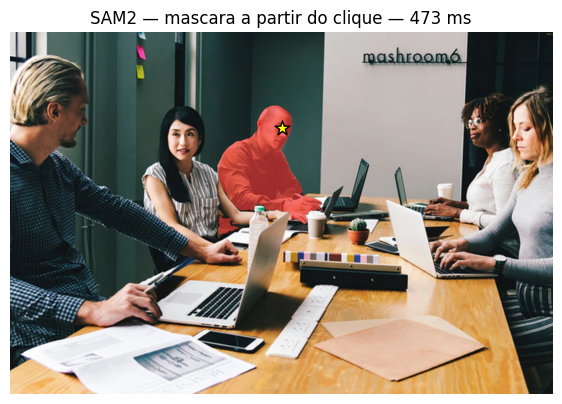

In [89]:
# click_xy foi definido pelos sliders da celula anterior (ou usa o valor default: centro da imagem)
print(f"Ponto usado como prompt para o SAM: {tuple(click_xy)}")

t0 = time.time()
sam_result = model_sam.predict(work_image_rgb, points=[list(click_xy)], labels=[1], verbose=False)
latency_sam_ms = (time.time() - t0) * 1000

mask_sam = sam_result[0].masks.data[0].cpu().numpy().astype(bool)

# guardamos para a sintese final (Secao 8)
saved_sam_result = {"mask": mask_sam, "click_xy": click_xy}

overlay_sam = work_image_rgb.copy().astype(float)
overlay_sam[mask_sam] = overlay_sam[mask_sam] * 0.4 + np.array([255, 60, 60]) * 0.6

fig, ax = plt.subplots(figsize=(7, 7))
ax.imshow(overlay_sam.astype(np.uint8))
ax.scatter(*click_xy, c="yellow", s=120, marker="*", edgecolors="black")
ax.set_title(f"SAM2 — mascara a partir do clique — {latency_sam_ms:.0f} ms")
ax.axis("off")
plt.show()


### 7.2 Conceito: SAM3 e prompts de texto

O SAM3 (mais recente) estende o conceito para aceitar **prompts de texto** diretamente — em vez de clicar, você descreve o objeto ("a mesa de madeira", "o cachorro à esquerda") e o modelo segmenta com base na descrição, combinando a ideia do SAM com a do CLIP (linguagem ↔ imagem). É a mesma lógica de zero-shot da Seção 5, aplicada a segmentação em vez de classificação:

```
CLIP:  texto  -->  rótulo mais provável para a imagem inteira
SAM3:  texto  -->  máscara do objeto descrito, dentro da imagem
```

Não vamos rodar o SAM3 ao vivo (checkpoint ainda mais pesado), mas vale registrar a tendência: **modelos fundacionais cada vez mais aceitam linguagem natural como prompt**, substituindo interfaces de clique/caixa.


### 7.3 Comparando com a máscara do Mask R-CNN (Seção 2)

A máscara do SAM (guiada pelo clique) contra a máscara mais próxima obtida pelo Mask R-CNN (limitada às 80 classes do COCO) na Seção 2.


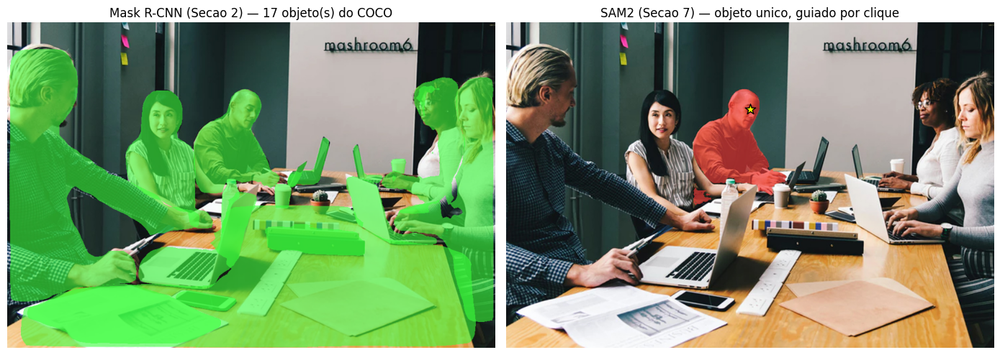

Mask R-CNN: segmenta automaticamente TODOS os objetos das 80 classes do COCO.
SAM:        segmenta QUALQUER objeto (sem lista fixa de classes), mas precisa de um prompt (clique/caixa/texto).


In [90]:
fig, axes = plt.subplots(1, 2, figsize=(14, 7))

axes[0].imshow(work_image_rgb)
mask_overlay_mrcnn = work_image_rgb.copy().astype(float)
for mask in saved_maskrcnn_result["masks"]:
    m = mask[0] > 0.5
    mask_overlay_mrcnn[m] = mask_overlay_mrcnn[m] * 0.4 + np.array([60, 255, 60]) * 0.6
axes[0].imshow(mask_overlay_mrcnn.astype(np.uint8))
axes[0].set_title(f"Mask R-CNN (Secao 2) — {len(saved_maskrcnn_result['masks'])} objeto(s) do COCO")
axes[0].axis("off")

axes[1].imshow(overlay_sam.astype(np.uint8))
axes[1].scatter(*click_xy, c="yellow", s=120, marker="*", edgecolors="black")
axes[1].set_title("SAM2 (Secao 7) — objeto unico, guiado por clique")
axes[1].axis("off")

plt.tight_layout()
plt.show()

print("Mask R-CNN: segmenta automaticamente TODOS os objetos das 80 classes do COCO.")
print("SAM:        segmenta QUALQUER objeto (sem lista fixa de classes), mas precisa de um prompt (clique/caixa/texto).")


### 7.4 Liberando a GPU


In [76]:
del model_sam, sam_result
gc.collect()
torch.cuda.empty_cache()
print("SAM removido da GPU.")


SAM removido da GPU.


In [77]:
if torch.cuda.is_available():
    free_gb, total_gb = torch.cuda.mem_get_info()
    print(f"GPU: {(total_gb - free_gb) / 1e9:.2f} GB em uso / {total_gb / 1e9:.1f} GB total")
!nvidia-smi --query-gpu=memory.used,memory.total --format=csv


GPU: 7.91 GB em uso / 15.6 GB total
memory.used [MiB], memory.total [MiB]
7539 MiB, 15360 MiB


---
# Seção 8 — Síntese Final: Uma Imagem, Pipeline Completo

Fechamos a noite reunindo os três "modos" de entender uma imagem que vimos ao longo da aula, todos na **mesma imagem de trabalho**:

1. **CLIP** — "o que é essa imagem, em linguagem natural?" (Seção 5)
2. **Detecção (YOLO/DETR)** — "quais objetos estão nela e onde?" (Seções 2/3)
3. **SAM** — "qual é o contorno exato de um objeto específico?" (Seção 7)

Esse é o padrão **CLIP → detecção → SAM** usado em pipelines reais de produção: linguagem natural entra, localização grosseira (caixa) sai, contorno preciso (máscara) sai — cada modelo fazendo a parte que faz melhor.


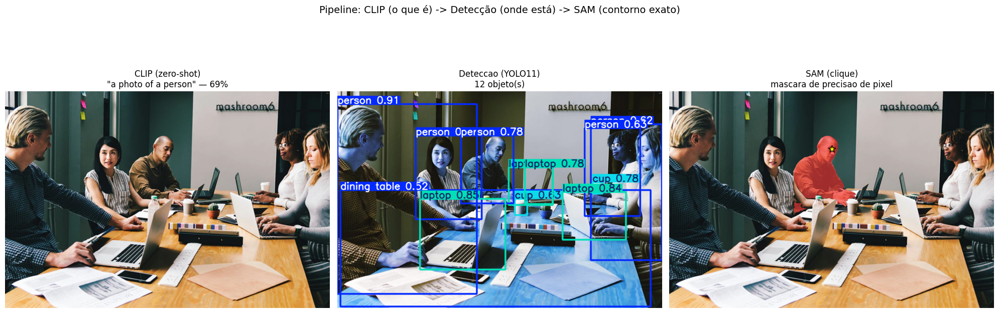

In [91]:
fig, axes = plt.subplots(1, 3, figsize=(20, 7))

# 1) CLIP — melhor rotulo textual
best_label, best_prob = saved_clip_result[0]
axes[0].imshow(work_image_rgb)
axes[0].set_title(f'CLIP (zero-shot)\n"{best_label}" — {best_prob:.0%}', fontsize=12)
axes[0].axis("off")

# 2) Deteccao — YOLO11 (Secao 3) ou DETR (Secao 4), o que estiver disponivel
axes[1].imshow(cv2.cvtColor(saved_yolo_result.plot(), cv2.COLOR_BGR2RGB))
axes[1].set_title(f"Deteccao (YOLO11)\n{len(saved_yolo_result.boxes)} objeto(s)", fontsize=12)
axes[1].axis("off")

# 3) SAM — mascara do clique
axes[2].imshow(overlay_sam.astype(np.uint8))
axes[2].scatter(*saved_sam_result["click_xy"], c="yellow", s=120, marker="*", edgecolors="black")
axes[2].set_title("SAM (clique)\nmascara de precisao de pixel", fontsize=12)
axes[2].axis("off")

fig.suptitle("Pipeline: CLIP (o que é) -> Detecção (onde está) -> SAM (contorno exato)", fontsize=14, y=1.03)
plt.tight_layout()
plt.show()


## Perguntas para discussão em grupo

1. Em um produto real (ex.: um app de e-commerce que busca roupas parecidas com uma foto, ou um robô que precisa pegar objetos específicos), qual seria a ordem certa de aplicar CLIP, um detector (YOLO/DETR) e o SAM? Por quê?
2. Por que faz sentido o SAM **não** ter uma lista fixa de classes, enquanto o Faster R-CNN e o YOLO têm? Que tipo de aplicação exige cada abordagem?
3. Stable Diffusion gera imagens a partir de texto; CLIP faz o caminho inverso (texto ↔ imagem para comparação). Como esses dois modelos poderiam ser combinados em um único produto?
4. Qual modelo da noite você usaria se tivesse que rodar em um celular, sem internet e sem GPU dedicada? E se tivesse um servidor com GPU robusta e latência não fosse problema?
5. Todos os modelos de detecção de hoje foram treinados no COCO (80 classes do cotidiano). Se sua empresa precisa detectar algo muito específico (um defeito de fábrica, uma peça de equipamento), qual dos modelos vistos hoje você usaria como ponto de partida — e o que mudaria no processo?
